In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os
import cv2
import glob
%matplotlib inline

# Camera caliberation 
#### Trying to get 3d object points and its corresponding 2d image points required for caliberationg camera

In [2]:
def Caliberate_camera(path_to_imgs,chess_board = (6,9)):
        """
        This function caliberates the camera and gets the camera parameters
        @param path_to_imgs : path to chessboard images ie (camera_cal/calibration*.jpg)
        @param chess_board  : chess board size
        """
        # prepare 3d points of chess board, like (0,0,0), (1,0,0), (2,0,0) ....,
        objp = np.zeros((chess_board[0]*chess_board[1],3), np.float32)
        objp[:,:2] = np.mgrid[0:chess_board[1], 0:chess_board[0]].T.reshape(-1,2)

        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d points in real world space
        imgpoints = [] # 2d points in image plane.

        # Make a list of calibration images
        images = glob.glob(path_to_imgs)

        # Step through the list and search for chessboard corners
        for idx, fname in enumerate(images):
            img = mpimg.imread(fname)
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

            # Find the chessboard corners (2d points in the image)
            ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

            # If found, add object points(3d), image points(2d)
            if ret == True:
                objpoints.append(objp)       # append 3d points to objpoints
                imgpoints.append(corners)    # append 2d points found to imgpoints

                # Draw and display the corners
                cv2.drawChessboardCorners(img, (9,6), corners, ret)
                #write_name = 'corners_found'+str(idx)+'.jpg'
                #cv2.imwrite(write_name, img)
                plt.title("image with chessboard corners")
                plt.imshow(img)
                plt.show()

        img_size = (img.shape[1],img.shape[0])        
        # Do camera calibration given object points and image points
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)   
        
        return ret, mtx, dist, rvecs, tvecs

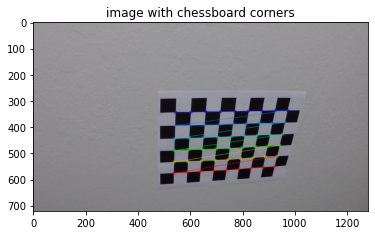

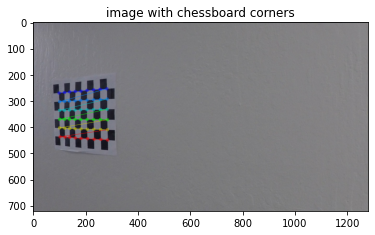

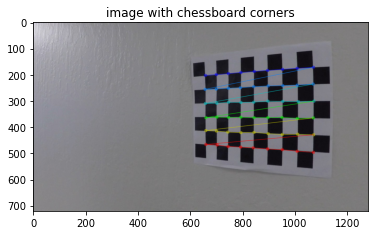

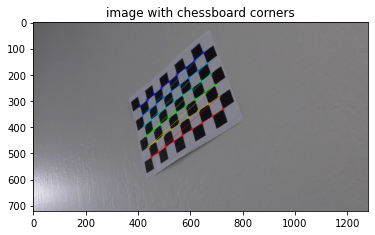

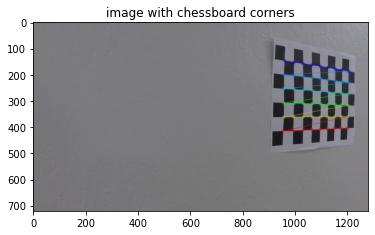

...

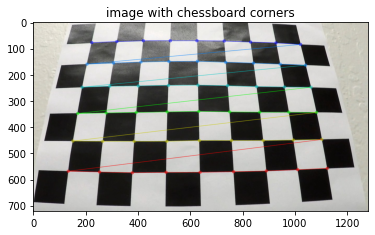

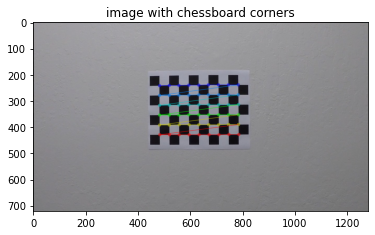

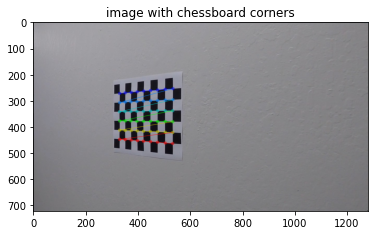

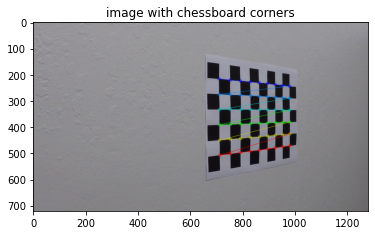

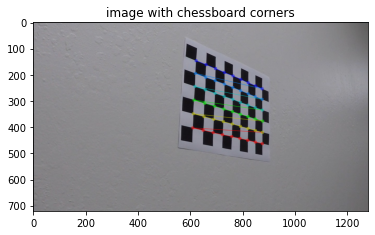

In [3]:
ret, mtx, dist, rvecs, tvecs = Caliberate_camera('camera_cal/calibration*.jpg')

In [24]:
# this will be used for testing purposes
images = glob.glob("test_images/*.jpg")

# Undistortion

In [5]:
# trying to undistort image


def undistort_img(img,mtx,dist):
    """
    This function uses distortion coeficient to correct the distortion of the image
    returns colored undistorted image
    """
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undistorted

# Test undistortion

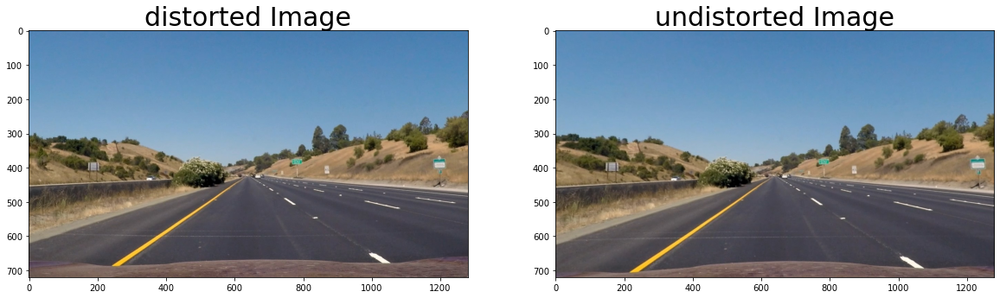

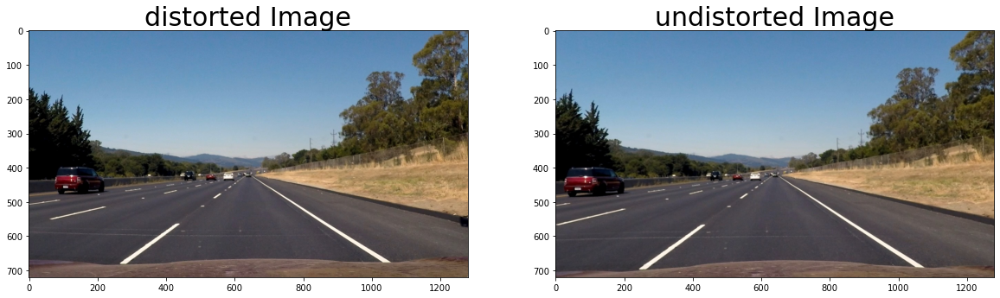

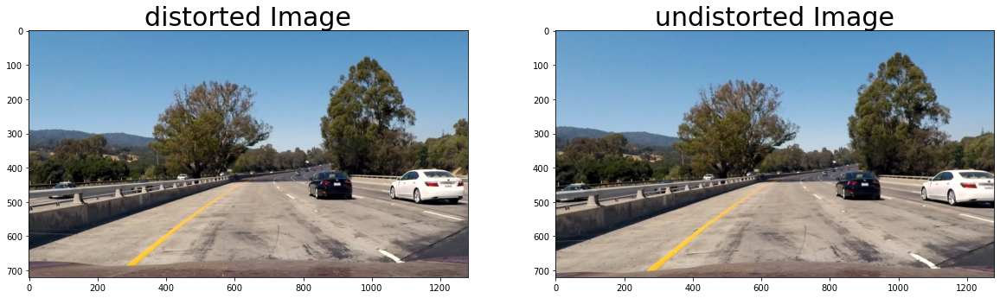

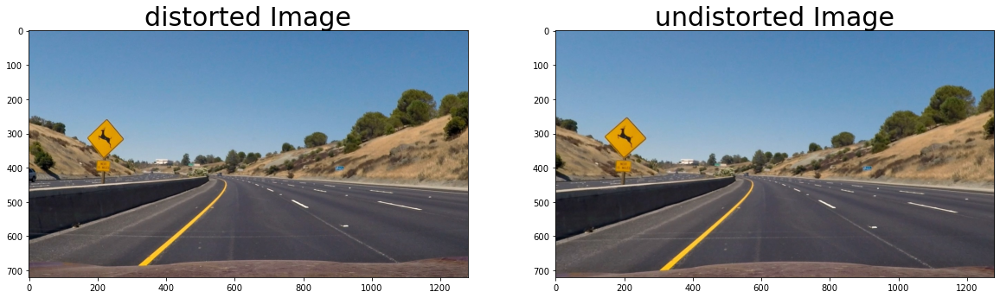

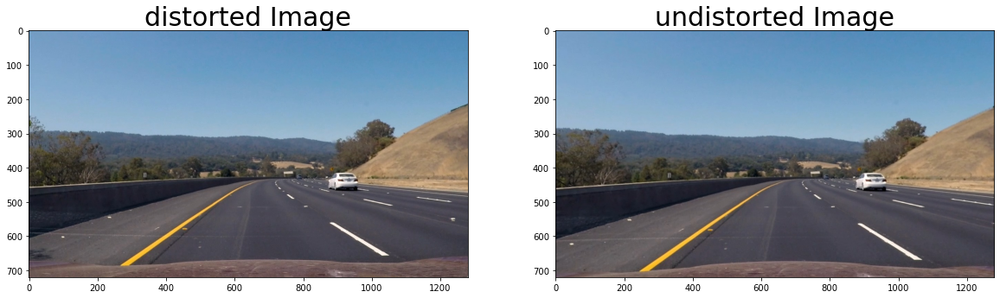

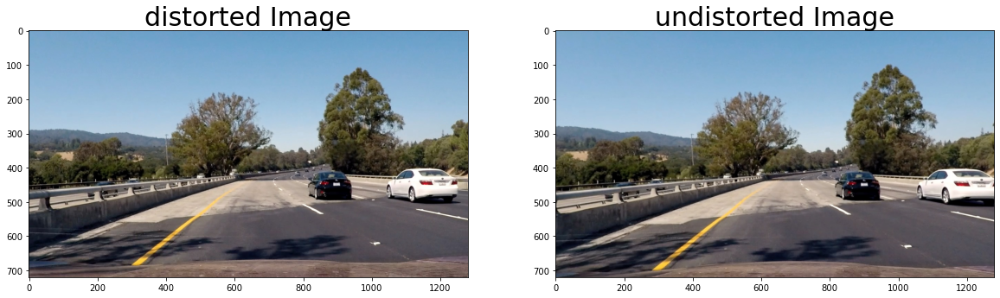

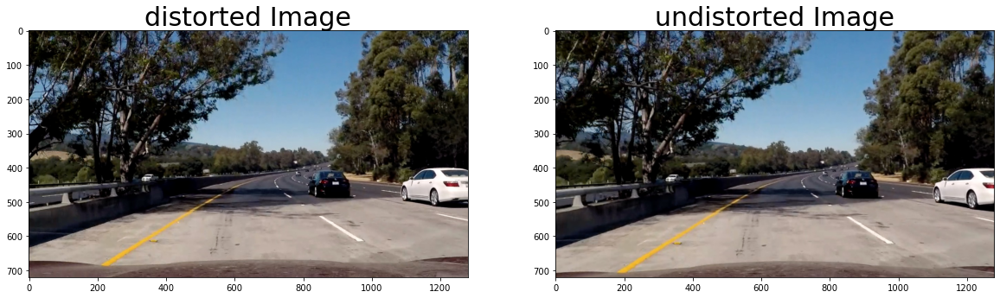

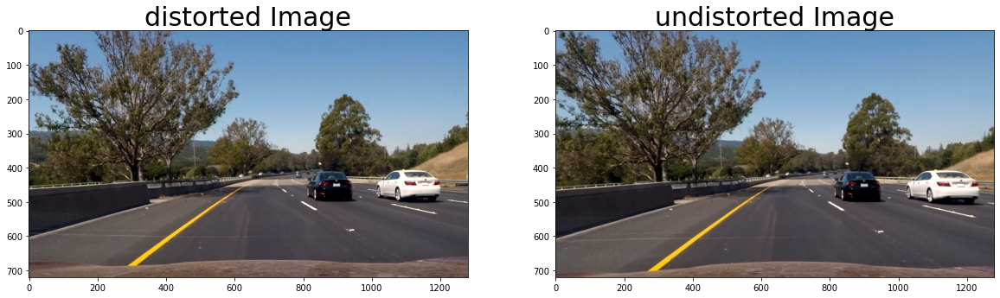

In [33]:


for img_path in images:
    distorted =  mpimg.imread(img_path)
    undistorted = undistort_img(distorted,mtx,dist)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(distorted)
    ax1.set_title('distorted Image', fontsize=30)
    ax2.imshow(undistorted)
    ax2.set_title('undistorted Image', fontsize=30) 
    

# Gradient Thresholding

In [41]:
def gradient_threshold(img, orient='x', thresh_min=0, thresh_max=255):
    """
    This function generates an output binary image
    Applying image gradient to the image in either direction or getting the magnitude of gradient
    @param img RGB image
    @param orient gradient orientation , default we take gradient in x-direction
    @param thresh_min,thresh_max minimum and maximum threshold to filter
    """
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    gradient = np.copy(gray)
    if orient == 'x':
        gradient = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize =  5)
    else:
        gradient = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize =  5)
    
    #  Take the absolute value of the derivative or gradient
    gardient_abs = np.absolute(gradient)
    
    #  Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*gardient_abs/np.max(gardient_abs))
    
    # Create a mask of 1's where the scaled gradient magnitude 
    binary_output = np.zeros_like(scaled_sobel)
    
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    return binary_output

# Test gradient_threshold

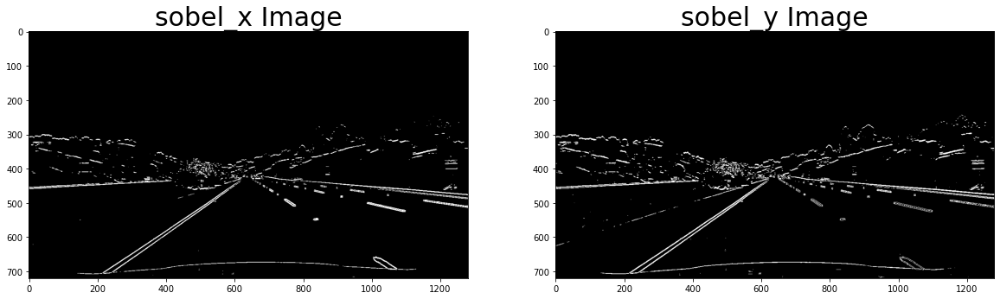

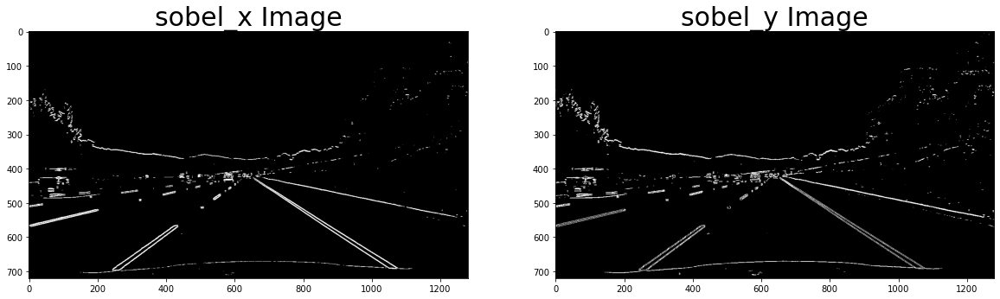

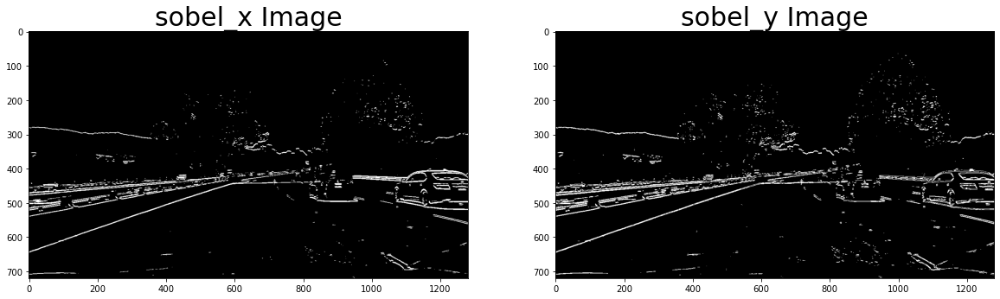

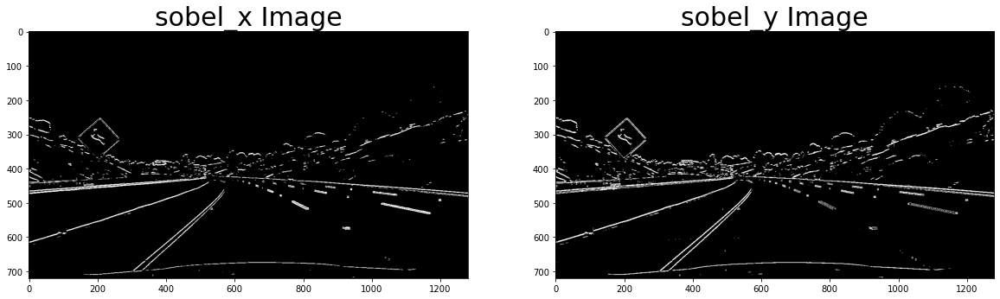

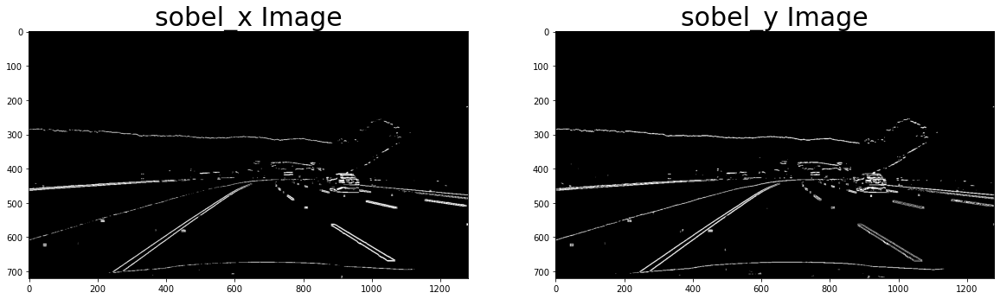

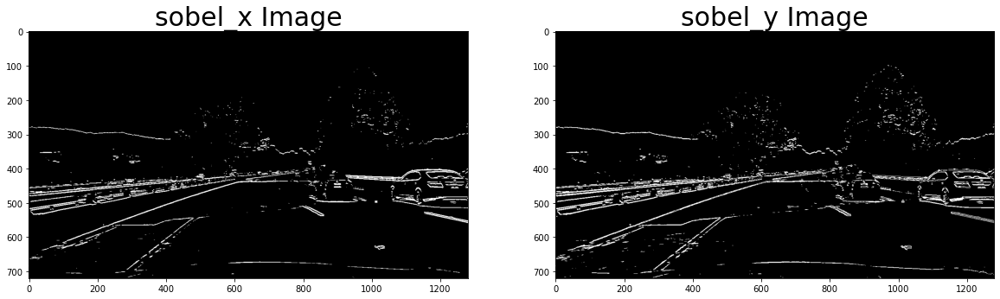

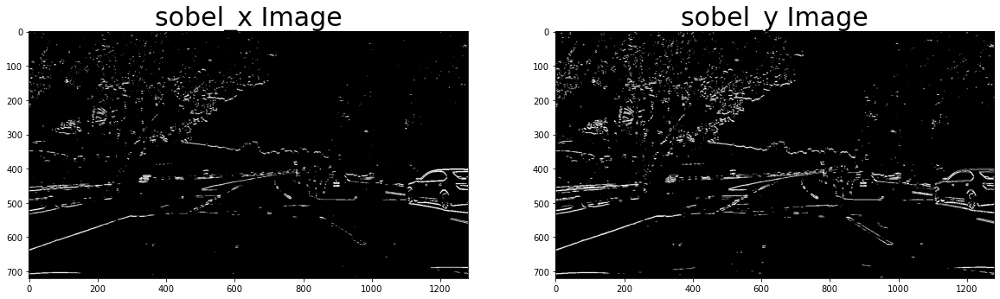

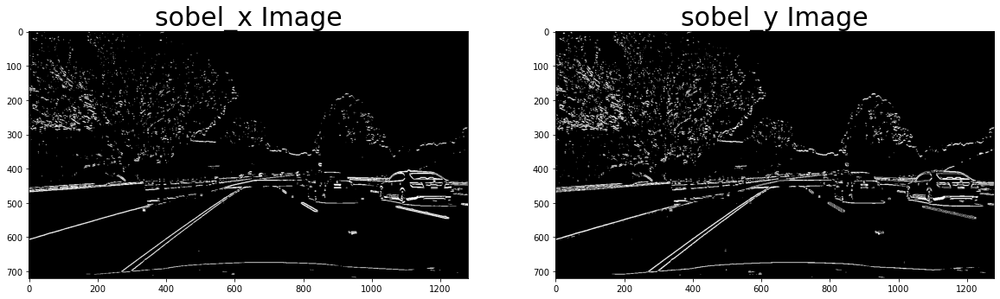

In [45]:
for img_path in images:
    distorted =  mpimg.imread(img_path)
    undistorted = undistort_img(distorted,mtx,dist)
    
    sobel_x = gradient_threshold(undistorted,20,60)
    sobel_y = gradient_threshold(undistorted,'y',50,150)
    
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(sobel_x,cmap='gray')
    ax1.set_title('sobel_x Image', fontsize=30)
    ax2.imshow(sobel_y,cmap='gray')
    ax2.set_title('sobel_y Image', fontsize=30) 

# Magnitude thresholding

In [48]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F,1,0,ksize =sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F,0,1,ksize =sobel_kernel)
    # 3) Calculate the magnitude 
    magn = np.sqrt( (np.square(sobel_x) + np.square(sobel_y)) ) 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*magn/np.max(magn))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1    
    # 6) Return this mask as your binary_output image
    return binary_output

# Test magnitude thresholding

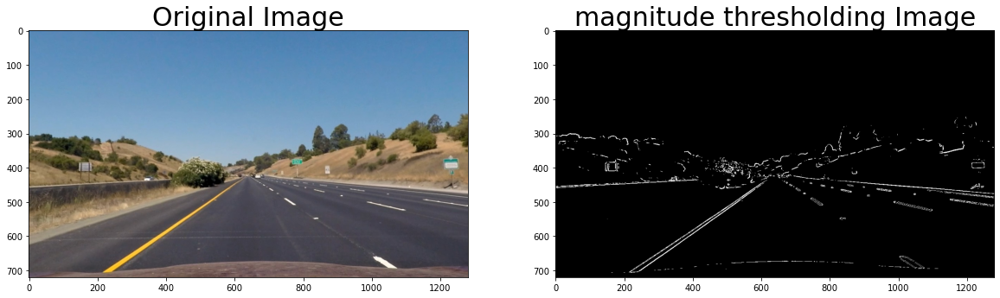

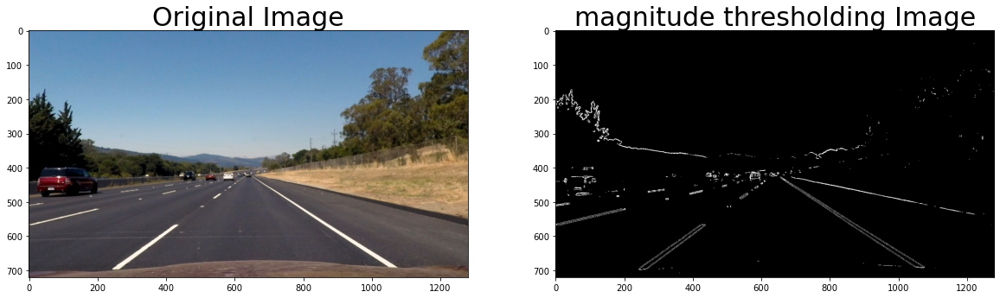

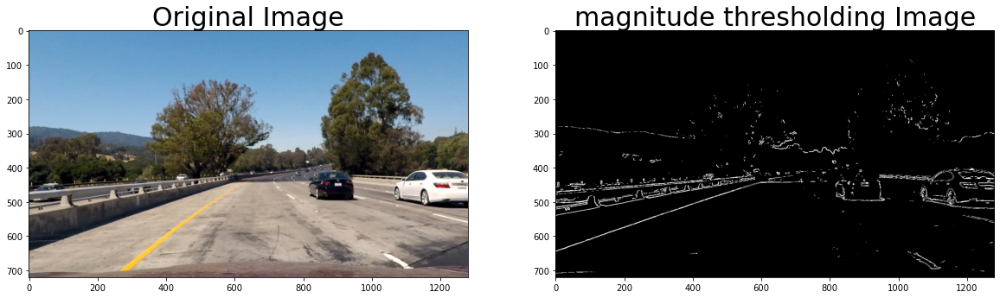

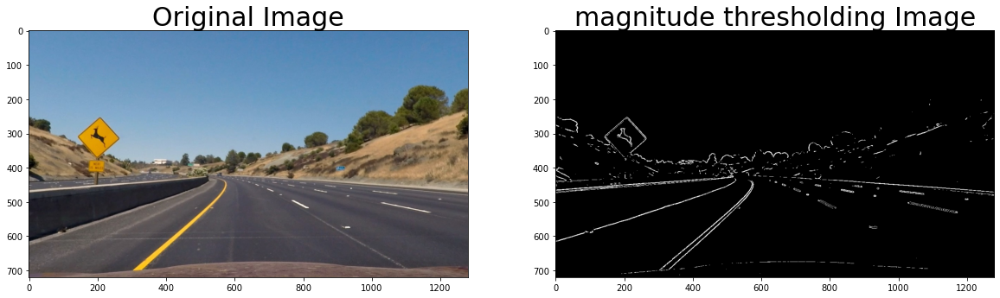

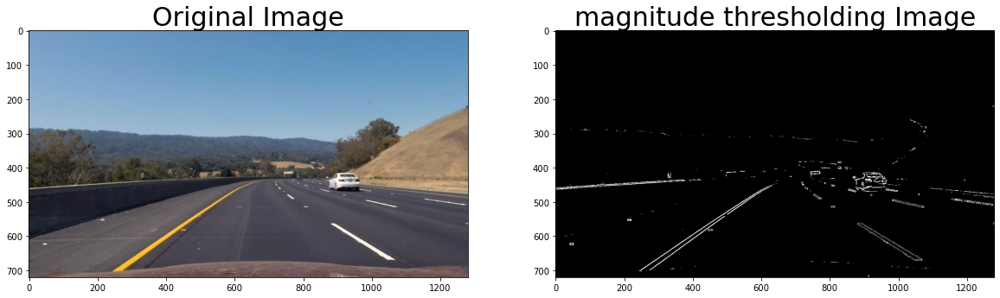

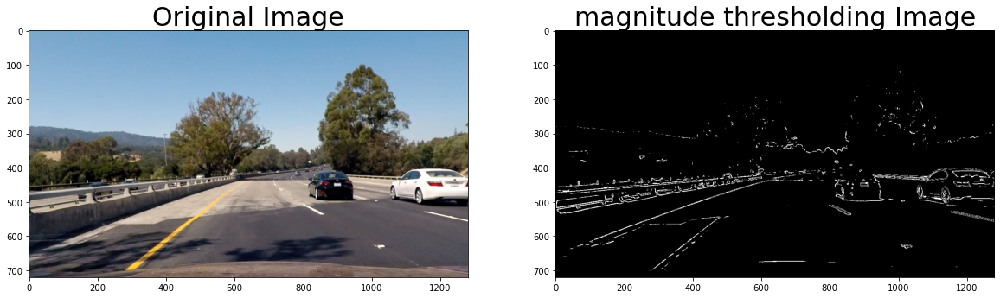

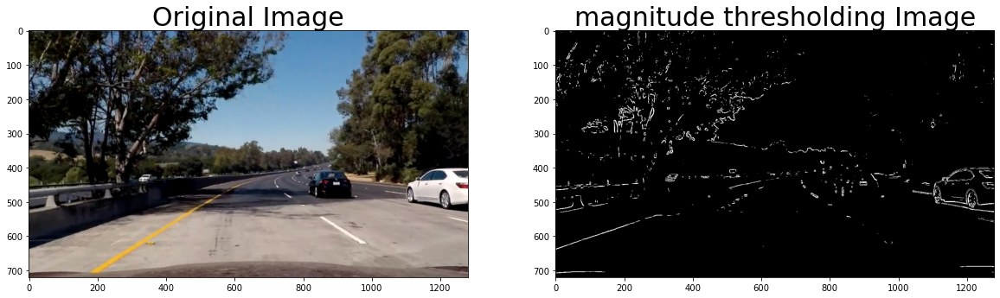

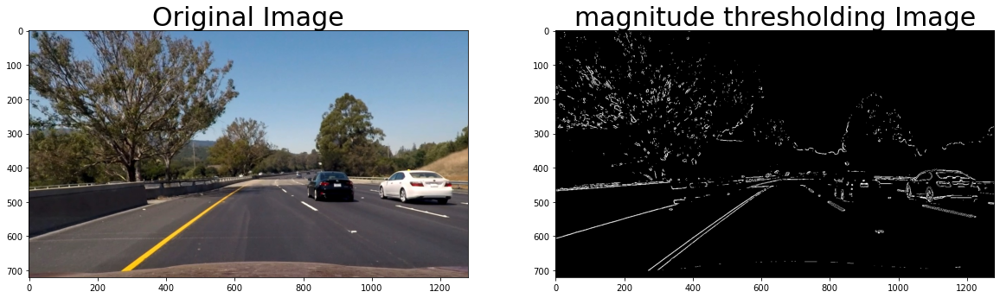

In [52]:
for img_path in images:
    distorted =  mpimg.imread(img_path)
    undistorted = undistort_img(distorted,mtx,dist)
    
    sobel_mag = mag_thresh(undistorted,sobel_kernel=5, mag_thresh=(80, 150))
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(undistorted)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(sobel_mag,cmap='gray')
    ax2.set_title('magnitude thresholding Image', fontsize=30) 

# Direction Thresholding

In [53]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(np.absolute(sobel_y),np.absolute(sobel_x))
    scaled_sobel = np.uint8(255*direction/np.max(direction))
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1    
    # 6) Return this mask as your binary_output image

    return binary_output

# Test Direction Thresholding

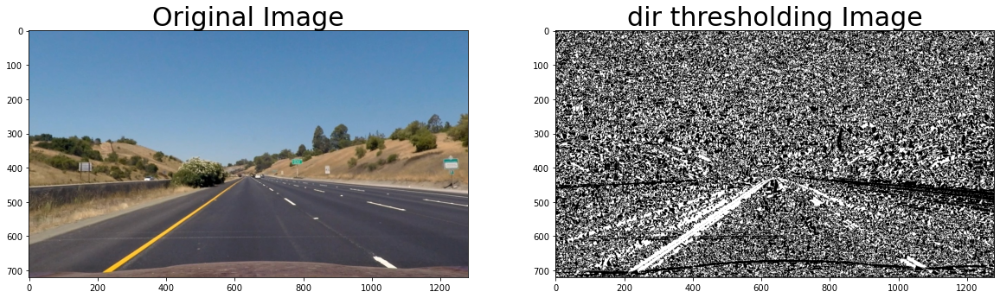

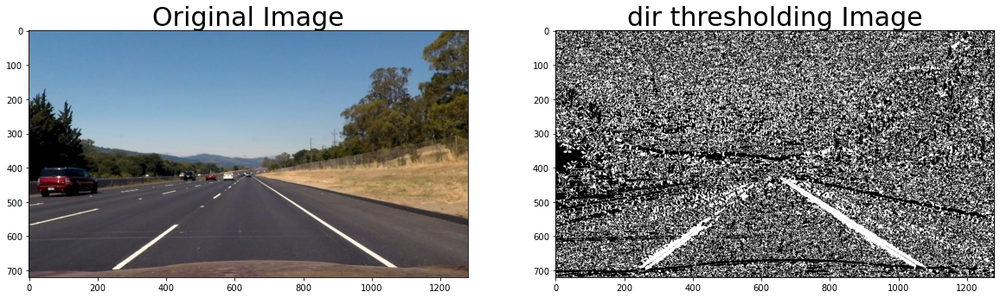

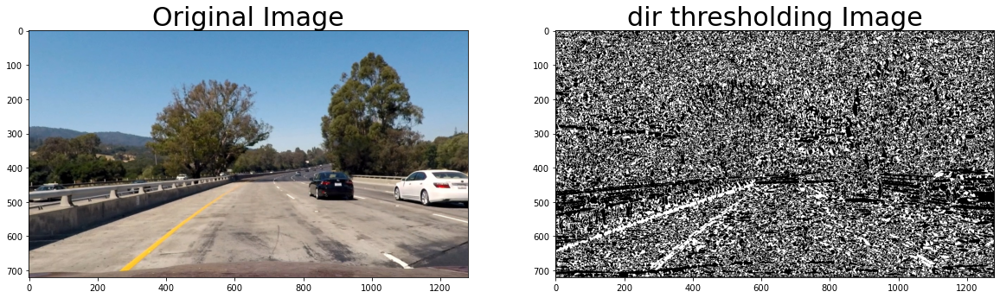

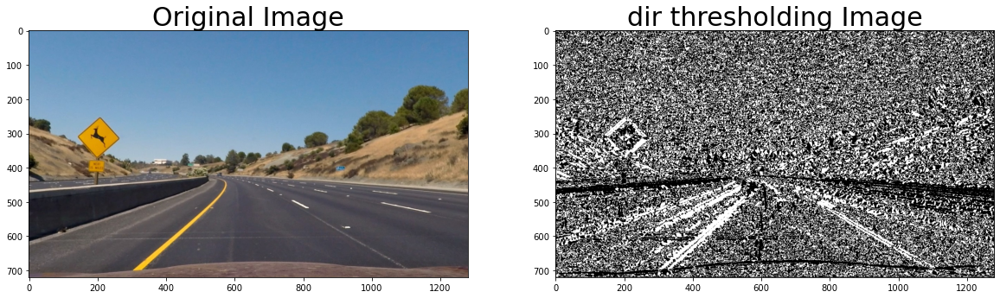

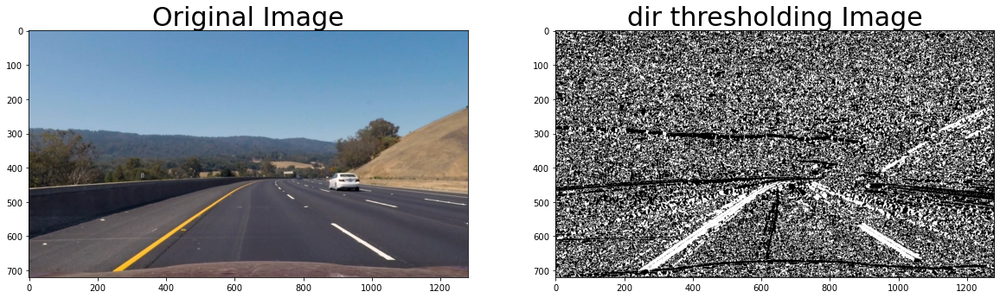

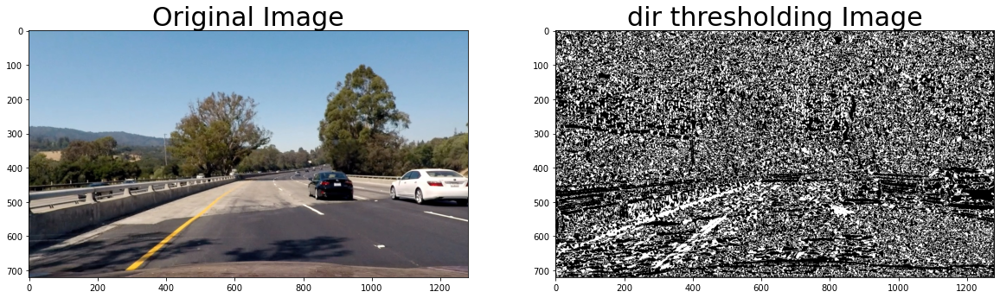

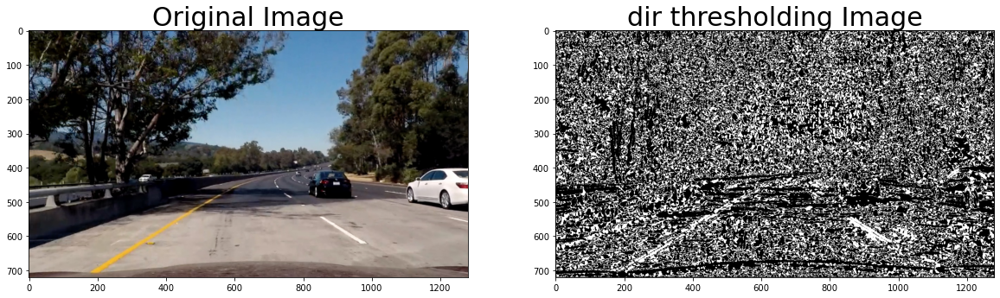

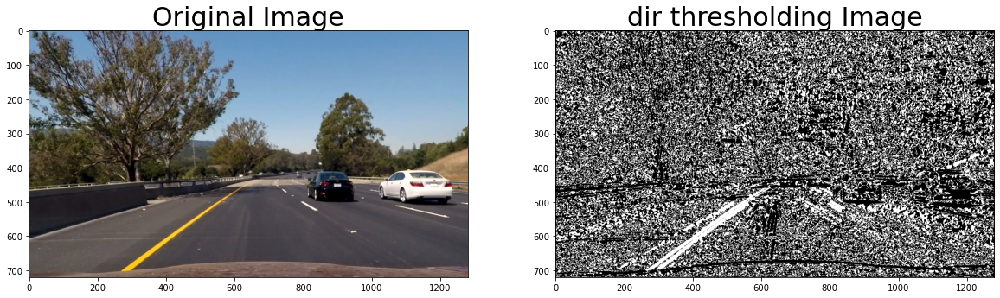

In [55]:
for img_path in images:
    distorted =  mpimg.imread(img_path)
    undistorted = undistort_img(distorted,mtx,dist)
    
    sobel_dir = dir_threshold(undistorted, sobel_kernel=15, thresh=(0.7, 1.3))
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(undistorted)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(sobel_dir,cmap='gray')
    ax2.set_title('dir thresholding Image', fontsize=30) 

In [18]:
def generate_binary_img(img):
    """
    This function generates a binary image which have two lane lines as an activated white pixels 
    Playing with color channels (HLS) and gradient thresholding (SOBEL)
    """
    # convert image to HLS 
    hls = cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    h_channel = hls[:,:,0]    # preserve the color
    l_channel = hls[:,:,1]    # how much pixel is bright
    s_channel = hls[:,:,2]    # how much pixel is shaded (more robust)
    
    
    plt.title("H channel")
    plt.imshow(h_channel,cmap = 'gray')
    plt.show()
    
    plt.title("L channel")
    plt.imshow(l_channel,cmap = 'gray')
    plt.show() 
    
    plt.title("S channel")
    plt.imshow(s_channel,cmap = 'gray')
    plt.show()    
    
    # compining threshold over the channels that can detect lines correctly
    # applying threshold on saturation channel 
        
    binary_s = np.zeros_like(s_channel)
    
    # saturation describes how true is the color
    binary_s[(s_channel > 185) & (s_channel<=255)] = 1
    
    plt.title("Binary Saturation")
    plt.imshow(binary_s,cmap = 'gray')
    plt.show()
    
    
    binary_l = np.zeros_like(l_channel)
    
    # lightness describes how bright is the color , so we trying to gain more imformation about the image
    # we need to get the white (lane lines) , we know that there are other colors for lane line but this 
    # will be more roboust for detecting white lane line
    binary_l[(l_channel >= 200) & (l_channel<=255)] = 1
    
    plt.title("Binary lightness")
    plt.imshow(binary_l,cmap = 'gray')
    plt.show()
    
    
    # applying gradient magnitude to an image 
    sobel_x = cv2.Sobel(gray, cv2.CV_64F,1,0,ksize =  5 )
    sobel_y = cv2.Sobel(gray, cv2.CV_64F,0,1,ksize = 5)
    
    
    magn = np.sqrt( (np.square(sobel_x) + np.square(sobel_y)) ) 
    #  Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel_mag = np.uint8(255*magn/np.max(magn))
    #  Create a binary mask where mag thresholds are met
    binary_output_mag = np.zeros_like(scaled_sobel_mag)
    binary_output_mag[(scaled_sobel_mag >=90) & (scaled_sobel_mag <= 150)] = 1 
    
    plt.title("image gradient")
    plt.imshow(binary_output_mag,cmap='gray')
    plt.show()
    
    # applying gradient direction to an image 
    direction = np.arctan2(np.absolute(sobel_y),np.absolute(sobel_x))
    scaled_sobel_dir = np.uint8(255*direction/np.max(direction))
    binary_output_dir = np.zeros_like(scaled_sobel_dir)
    binary_output_dir[(direction >= 0.7) & (direction <= 1.3)] = 1
    
    plt.title("image direction")
    plt.imshow(binary_output_dir,cmap='gray')
    plt.show()
    
    # TODO make a compination
    binary_combined = np.zeros_like(s_channel)
    
    binary_combined[ (binary_l ==1) | (binary_s==1) | ((direction==1) & (magn ==1 ))] = 1 
    
    plt.title("compined")
    plt.imshow(binary_combined,cmap='gray')
    plt.show()
    cv2.imwrite("output_images\compined_binary.jpg",binary_combined)
    
    return binary_combined

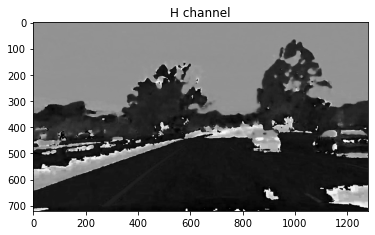

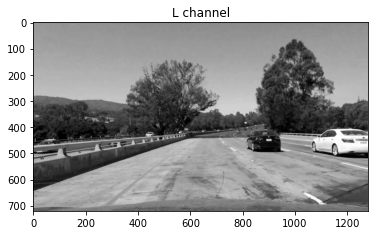

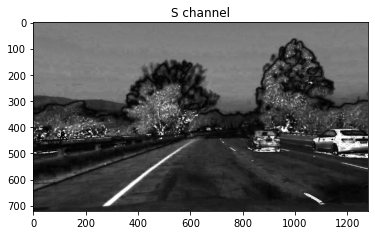

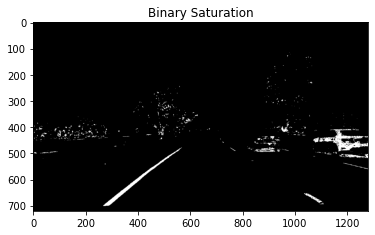

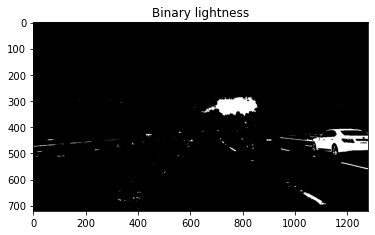

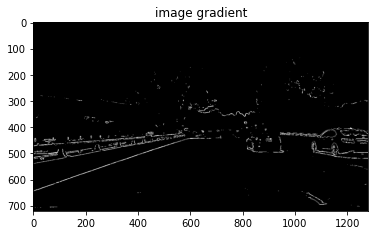

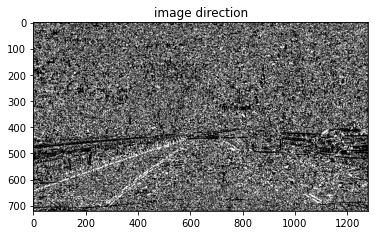

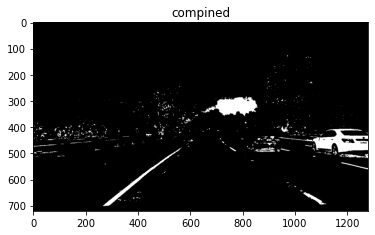

In [19]:
binary_img = generate_binary_img(undistorted)

In [22]:
def bird_view(img):
    """
    This function performs prespective transformation to an image to get bird's eye view
    """
    #src = np.float32([[428,353],[549,349],[180,538],[875,539]])
    #dst = np.float32([[420,91],[640,91],[415,537],[637,538]])
    
    src = np.float32([[528,503],[780,494],[265,702],[1095,679]])
    dst = np.float32([[530,224],[787,225],[531,510],[790,495]])
    # get the bird's eye view of the frame 
    M = cv2.getPerspectiveTransform(src, dst)
    warp = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))
    plt.title("Bird's eye view")
    plt.imshow(warp,cmap = 'gray')
    plt.show()    
    
    return warp

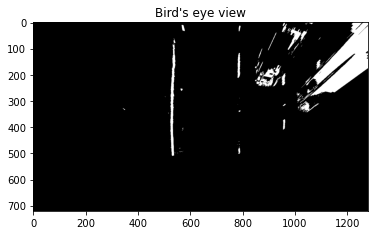

array([[0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [21]:
bird_view(binary_img)